# Анализ активности покупателей театральных билетов, расчет бизнес метрик и составление рекомендаций маркетологам

**Что в наличии:**
`Лог визитов на сайт`
`Лог заказов, сделанных на сайте` 
`Расходы на каждый из источников привлечения трафика`

**Что нужно сделать:**
- [Подготовить данные](#s1)
- [Посчитать DAU, WAU, MAU](#s2_t1)
- [Посчитать число пользовательских сессий в день и длительность сессии](#s2_t2)
- [Посчитать Retention Rate по визитам - в целом и на срезах разных платформ](#s2_t3)
- [В какой момент пользователи готовы покупать (относительно первого появления на сайте)](#s2_t4)
- [Cколько покупок совершается за день, неделю, месяц?](#s2_t5)
- [Каков средний чек помесячно и покогортно?](#s2_t6)
- [Посчитать LTV](#s2_t7)
- [Посчитать ежемесячные траты - в целом и по источникам](#s2_t8)
- [Посчитать CAC](#s2_t9)
- [Посчитать ROMI](#s2_t10)

**[На основе полученных данных составить рекомендации для маркетологов:
    Какие источники/платформы вы бы порекомендовали? На какие метрики вы ориентируетесь? Почему?](#s3)**

### Шаг 1. Подготовка данных <a id='s1'></a> 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
matplotlib.style.use('ggplot')
import plotly.express as px

In [2]:
visits = pd.read_csv('visits_log.csv')
orders = pd.read_csv('orders_log.csv')
costs = pd.read_csv('costs.csv')

In [3]:
#ознакомимся с данными
print (visits.head())
print (visits.info()) 
print (orders.head())
print (orders.info())
print (costs.head())
print (costs.info())

    Device               End Ts  Source Id             Start Ts  \
0    touch  2017-12-20 17:38:00          4  2017-12-20 17:20:00   
1  desktop  2018-02-19 17:21:00          2  2018-02-19 16:53:00   
2    touch  2017-07-01 01:54:00          5  2017-07-01 01:54:00   
3  desktop  2018-05-20 11:23:00          9  2018-05-20 10:59:00   
4  desktop  2017-12-27 14:06:00          3  2017-12-27 14:06:00   

                    Uid  
0  16879256277535980062  
1    104060357244891740  
2   7459035603376831527  
3  16174680259334210214  
4   9969694820036681168  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Device     359400 non-null  object
 1   End Ts     359400 non-null  object
 2   Source Id  359400 non-null  int64 
 3   Start Ts   359400 non-null  object
 4   Uid        359400 non-null  uint64
dtypes: int64(1), object(3), uint64(1)
memory usage

#время - в datetime, заголовки- к однообразному виду, удалим дубли

In [4]:
visits.set_axis(['device', 'datetime_end', 'source_id', 'datetime_start', 'uid'], axis = 'columns', inplace = True)
visits['datetime_start'] = pd.to_datetime(visits['datetime_start'])
visits['datetime_end'] = pd.to_datetime(visits['datetime_end'])
visits = visits.drop_duplicates()
orders.set_axis(['datetime_purchase', 'revenue', 'uid'], axis = 'columns', inplace = True)
orders['datetime_purchase'] = pd.to_datetime(orders['datetime_purchase'])
orders = orders.drop_duplicates()
costs['dt'] = pd.to_datetime(costs['dt'])
costs = costs.drop_duplicates()

In [5]:
#проверим, что ни у кого конец сессии не раньше начала
print(visits[visits['datetime_start'] > visits['datetime_end']]) 

         device        datetime_end  source_id      datetime_start  \
4181    desktop 2018-03-25 03:18:00          3 2018-03-25 03:50:00   
177972  desktop 2018-03-25 03:09:00          9 2018-03-25 03:55:00   

                         uid  
4181    13092152539246794986  
177972   4621202742905035453  


In [6]:
#уберем дубли
visits = visits[~(visits['datetime_start'] > visits['datetime_end'])] 

### Шаг 2. Постройте отчёты и посчитайте метрики


#### Посчитаем DAU, WAU, MAU <a id='s2_t1'></a> 

In [7]:
def DMW(df, period, astype, period_str, title):
    df[period] = df['datetime_start'].astype(astype)
    visits_by_period = visits.groupby(period).agg({'uid':['count', 'nunique']}) 
    visits_by_period.columns = ['session_count', 'uid_count']
    visits_by_period = visits_by_period.reset_index()
    fig1 = px.bar(
        visits_by_period
        , x= period
        , y= 'uid_count'
        , color = 'uid_count'
        , title=title
        , labels={period:'Дата', 'uid_count':'Число пользователей'})

    fig1.update_xaxes(tickangle=45) 
    fig1.show()
    return 'В среднем пользователей в {}: {:.2f}'.format(period_str, visits_by_period['uid_count'].mean())

- DAU

In [8]:
DMW(visits, 'visit_day', 'datetime64[D]', 'день', 'DAU')

'В среднем пользователей в день: 907.99'

- WAU

In [9]:
DMW(visits, 'visit_week', 'datetime64[W]', 'неделю', 'WAU')

'В среднем пользователей в неделю: 5724.42'

In [10]:
DMW(visits, 'visit_month', 'datetime64[M]', 'месяц', 'MAU')

'В среднем пользователей в месяц: 23228.42'

#### Посчитаем число пользовательских сессий в день <a id='s2_t2'></a> 

In [11]:
# Сессии в день
visits_by_day = visits.groupby('visit_day').agg({'uid':'count'}) 
visits_by_day.columns = ['session_daily_count']
visits_by_day = visits_by_day.reset_index()
fig4 = px.bar(
    visits_by_day
    , x= 'visit_day'
    , y= 'session_daily_count'
    , color = 'session_daily_count'
    , title='Session count: daily'
    , labels={'visit_day':'Дата', 'session_daily_count':'Число пользователей'})

fig4.update_xaxes(tickangle=45) 
fig4.show()

print('В среднем сессий в день:', visits_by_day['session_daily_count'].mean()) 

В среднем сессий в день: 987.3571428571429


Длительность сессии

In [12]:
visits['session_duration_sec'] = (visits['datetime_end'] - visits['datetime_start']).dt.seconds
fig5 = px.histogram(visits
                   , x="session_duration_sec"
                  ,labels={'session_duration_sec':'Длительность сессии, сек'})

fig5.show()

In [13]:
#посчитаем моду тк распределение смещено
average_session_length = visits['session_duration_sec'].mode().mean() 
print('В среднем одна сеccия длится {} секунд'.format(average_session_length))

В среднем одна сеccия длится 60.0 секунд


#### Посчитаем Retention Rate<a id='s2_t3'></a> 

- Все типы устройств, помесячные когорты (календарный месяц)

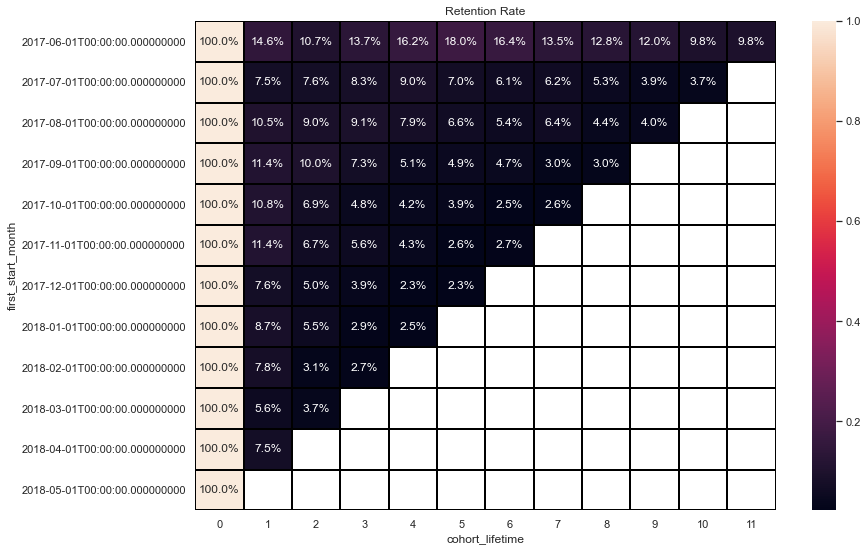

In [14]:
#
first_visit_date = visits.groupby(['uid'])['datetime_start'].min() 
first_visit_date.name = 'first_start'
visits = visits.merge(first_visit_date,on='uid')

visits['first_start_month'] = visits['first_start'].astype('datetime64[M]')
visits['cohort_lifetime'] = ((visits['visit_month'] - visits['first_start_month'])/ np.timedelta64(1,'M')).round().astype(int)
cohorts = visits.pivot_table(index = ['first_start_month', 'cohort_lifetime'], values = 'uid', aggfunc = 'count').reset_index()
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][['first_start_month','uid']].rename(columns={'uid':'cohort_users'})
cohorts = cohorts.merge(initial_users_count,on='first_start_month')
cohorts['retention'] = cohorts['uid']/cohorts['cohort_users']

retention_pivot = cohorts.pivot_table(index = 'first_start_month', columns = 'cohort_lifetime', values = 'retention', aggfunc = 'sum')

sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Retention Rate')
sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='black');


- Мобильные устройства, помесячные когорты (календарный месяц)

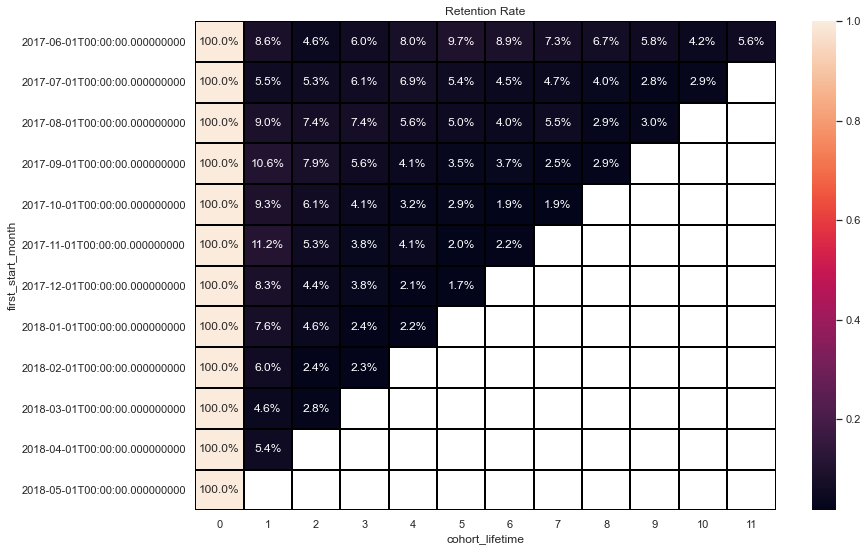

In [15]:
cohorts_touch = visits[visits['device'] == 'touch'].pivot_table(index = ['first_start_month', 'cohort_lifetime'], values = 'uid', aggfunc = 'count').reset_index()
initial_users_count_touch = cohorts_touch[cohorts_touch['cohort_lifetime'] == 0][['first_start_month','uid']].rename(columns={'uid':'cohort_users'})
cohorts_touch = cohorts_touch.merge(initial_users_count_touch,on='first_start_month')
cohorts_touch['retention'] = cohorts_touch['uid']/cohorts_touch['cohort_users']
retention_pivot_touch = cohorts_touch.pivot_table(index = 'first_start_month', columns = 'cohort_lifetime', values = 'retention', aggfunc = 'sum')
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Retention Rate')
sns.heatmap(retention_pivot_touch, annot=True, fmt='.1%', linewidths=1, linecolor='black');

- Десктоп, помесячные когорты (календарный месяц)

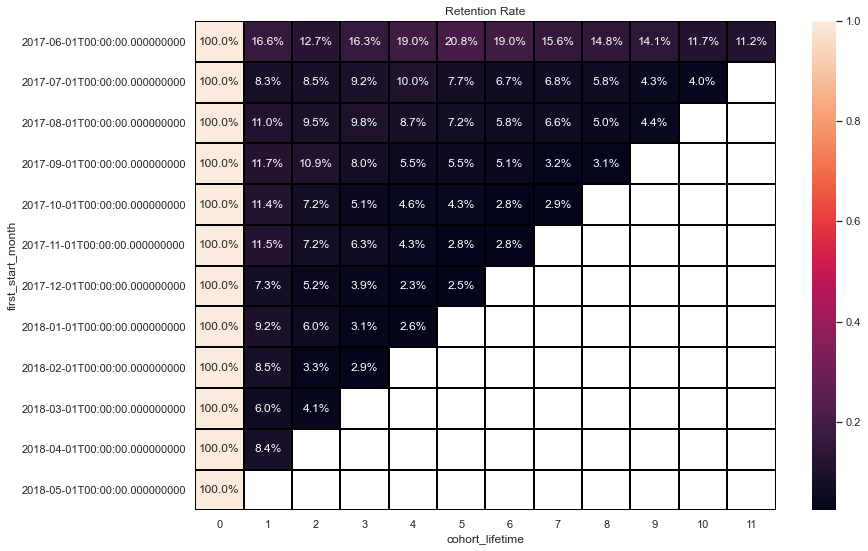

In [16]:
cohorts_desktop = visits[visits['device'] == 'desktop'].pivot_table(index = ['first_start_month', 'cohort_lifetime'], values = 'uid', aggfunc = 'count').reset_index()
initial_users_count_desktop = cohorts_desktop[cohorts_desktop['cohort_lifetime'] == 0][['first_start_month','uid']].rename(columns={'uid':'cohort_users'})
cohorts_desktop = cohorts_desktop.merge(initial_users_count_desktop,on='first_start_month')
cohorts_desktop['retention'] = cohorts_desktop['uid']/cohorts_desktop['cohort_users']
retention_pivot_desktop = cohorts_desktop.pivot_table(index = 'first_start_month', columns = 'cohort_lifetime', values = 'retention', aggfunc = 'sum')
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Retention Rate')
sns.heatmap(retention_pivot_desktop, annot=True, fmt='.1%', linewidths=1, linecolor='black');

**Вывод**: Retention выше на десктопе. Нужно посмотреть, все ли в порядке с дизайном на мобильных устройствах

#### В какой момент пользователи готовы к первой покупке (относительно первого появления на сайте)?
 <a id='s2_t4'></a> 

In [17]:
#Сколько дней проходит между первым визитом (first_start) и первой покупкой
orders['order_day'] = orders['datetime_purchase'].astype('datetime64[D]')
orders['order_week'] = orders['datetime_purchase'].astype('datetime64[W]')
orders['order_month'] = orders['datetime_purchase'].astype('datetime64[M]')
orders_first = orders.groupby(['uid'])['datetime_purchase'].min()
orders_first.name = 'first_purchase'
orders = orders.merge(orders_first, on = 'uid')

In [18]:
#объединим визиты и покупки, оставим только пересекающихся пользователей
agg_table = visits.merge(orders, left_on = ['uid', 'visit_day'], right_on = ['uid', 'order_day'])
agg_table['order_visit_diff'] = (agg_table['first_purchase'] - agg_table['first_start']).dt.days

In [19]:
# посмотрим на распределение в табличном виде
first_purchase_data_grouped = agg_table.groupby('order_visit_diff').agg({'uid':'nunique'}).reset_index()
print(first_purchase_data_grouped.head(15))

    order_visit_diff    uid
0                  0  25818
1                  1    679
2                  2    347
3                  3    284
4                  4    191
5                  5    181
6                  6    170
7                  7    142
8                  8    111
9                  9     95
10                10     86
11                11     66
12                12     73
13                13     80
14                14     74


In [20]:
#разобьем на группы
def split(date_diff): 
    if date_diff == 0:
        return '0'
    elif 1 <= date_diff <= 10:
        return '1-10'
    elif 10 < date_diff <= 20:
        return '11-20'
    elif 20 < date_diff <= 30:
        return '21-30'
    elif 30 < date_diff <= 60:
        return '30-60'
    elif 60 < date_diff <= 90:
        return '60-90'
    else:
        return '90+'

first_purchase_data_grouped['range'] = first_purchase_data_grouped['order_visit_diff'].apply(split)

first_purchase = first_purchase_data_grouped.groupby('range').agg({'uid':'sum'}).reset_index()

In [21]:
#построим график
fig6 = px.bar(
   first_purchase
    , x= 'range'
    , y= 'uid'
    , color = 'uid'
    , title='Время между визитом и первой покупкой, дни'
    , labels={'range':'Дней между 1 визитом и покупкой', 'uid':'Число покупателей'})

fig6.update_xaxes(tickangle=45) 
fig6.show()

In [22]:
#процент заказов, сделанных в день первого визита
orders_on_first_visit = first_purchase_data_grouped[first_purchase_data_grouped['order_visit_diff'] == 0]['uid']
orders_on_all_visits = first_purchase_data_grouped['uid'].sum()

print("Процент первых заказов, сделанных в день первого визита:{:.1%}".format(float(orders_on_first_visit/orders_on_all_visits))) 

Процент первых заказов, сделанных в день первого визита:79.9%


**Вывод**: в среднем люди начинают покупать в день первого же визита, и делают так почти в 80% случаев. Это хорошо, стоит удерживать качество первого впечатления.

#### Cколько покупок совершается за день, неделю, месяц? <a id='s2_t5'></a>

In [40]:
def periodic_purchase(df, agg_column, title1, title2, label_1, label_1_genitive):
    #покупок за период
    orders_per_period = df.groupby(agg_column).agg({'uid': ['count', 'nunique']}).reset_index()
    orders_per_period.columns = ['order_period','order_count', 'number_uid']
    orders_per_period['orders_per_user'] = orders_per_period['order_count']/orders_per_period['number_uid']
    
    fig7 = px.bar(
        orders_per_period
        , x= 'order_period'
        , y= 'order_count'
        , color = 'order_period'
        , title= title1
        , labels={'order_period':label_1, 'order_count':'Число заказов'})
    fig7.update_xaxes(tickangle=45) 
    fig7.show()
    
    #покупок на одного пользователя в период
    fig8 = px.bar(
        orders_per_period
        , x= 'order_period'
        , y= 'orders_per_user'
        , color = 'order_period'
        , title= title2
        , labels={'order_period':label_1, 'orders_per_user':'Число заказов на пользователя'})
    fig8.update_xaxes(tickangle=45)
    fig8.show()
    return ('В среднем покупают {:.2f} раз в {}'.format(orders_per_period['order_count'].mean(), label_1_genitive),
    'В среднем один пользователь покупает {:.2f} раз в {}'.format(orders_per_period['orders_per_user'].mean(), label_1_genitive))

- Сколько покупок совершается в день

In [41]:
periodic_purchase(orders, 'order_day', 'Число заказов в день', 'Число заказов на пользователя в день', 'Дни заказа', 'день')

('В среднем покупают 138.50 раз в день',
 'В среднем один пользователь покупает 1.08 раз в день')

- Сколько покупок совершается в неделю

In [42]:
periodic_purchase(orders, 'order_week', 'Число заказов в неделю', 'Число заказов на пользователя в неделю', 'Недели заказа', 'неделю')

('В среднем покупают 951.23 раз в неделю',
 'В среднем один пользователь покупает 1.16 раз в неделю')

- Сколько покупок совершается в месяц

In [43]:
periodic_purchase(orders, 'order_month', 'Число заказов в месяц', 'Число заказов на пользователя в месяц', 'Месяцы заказа', 'месяц')

('В среднем покупают 3878.08 раз в месяц',
 'В среднем один пользователь покупает 1.21 раз в месяц')

#### Какой средний чек помесячно и покогортно?<a id='s2_t6'></a> 

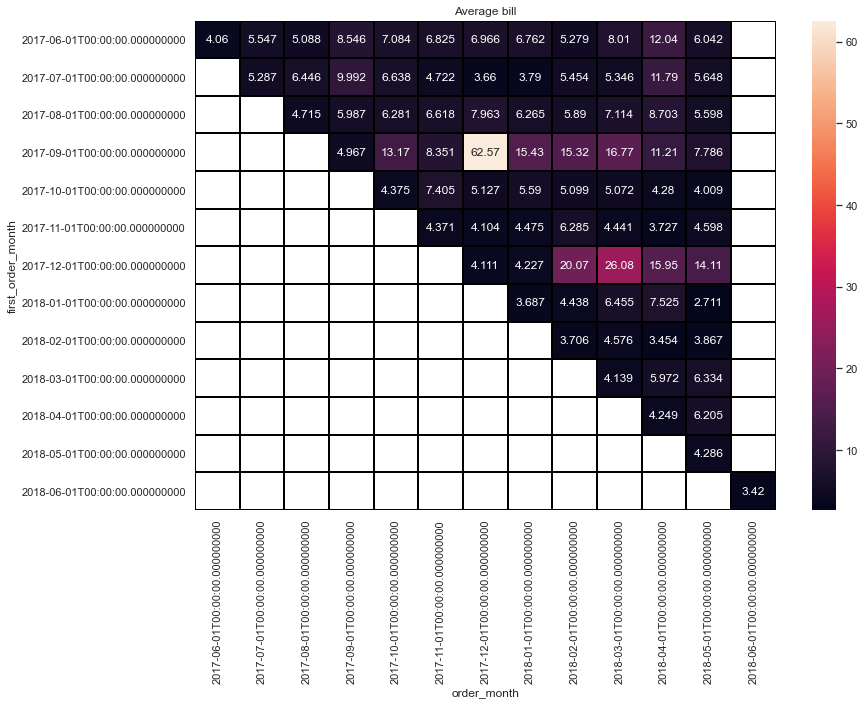

In [44]:
#посчитаем покогортно, когорты будут помесячные, так видно динамику
orders['first_order_month'] = orders['first_purchase'].astype('datetime64[M]')
cohorts = orders.groupby(['first_order_month', 'order_month']).agg({'revenue':['sum', 'count'], 'uid': 'nunique'}).reset_index()# про запас посчитаем уникальных пользователей
cohorts.columns = ['first_order_month', 'order_month', 'revenue_sum', 'revenue_count', 'uid_count']
cohorts['average_bill'] = cohorts['revenue_sum']/ cohorts['revenue_count']

average_bill_result = cohorts.pivot_table(
        index='first_order_month',
        columns='order_month', 
        values='average_bill', 
        aggfunc='mean') #сознательно не считаю lifetime -  хочу видеть географический месяц, тк, как было видно по предыдущим рассчетам, и у визитов, и у заказов есть сезонность

sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Average bill')
sns.heatmap(average_bill_result, annot=True, fmt='.4', linewidths=1, linecolor='black');

**Вывод**: можно вывести средний чек просто помесячно, но гораздо интереснее, что средний чек напрямую зависит от того, когда пользователь начал покупать. Самый большой средний чек у сентябрьской когорты - Это логично. если удалось сподвигнуть человека на покупку в сентябре, он видит, что перед ним "высокий сезон" - погода плохая, событий много, и всю осень и зиму ходит по мероприятиям. Также активна декабрьская когорта. Ну и многие когорты в сентябре и декабре дают хорошие результаты. Два новых года, как-никак. 
Мораль - надо как можно больше людей заставить совершить первую покупку в сентябре или декабре - они дальше приносят много денег.

#### Посчитать LTV <a id='s2_t7'></a> 

- LTV по месяцам

In [45]:
#посчитаем age
cohorts['age'] = (cohorts['order_month'] - cohorts['first_order_month']) / np.timedelta64(1, 'M')
cohorts['age'] = cohorts['age'].round().astype('int')

In [46]:
#для целей проекта маржинальность была принята за 100%
cohorts['ltv'] = cohorts['revenue_sum']/ cohorts['uid_count']

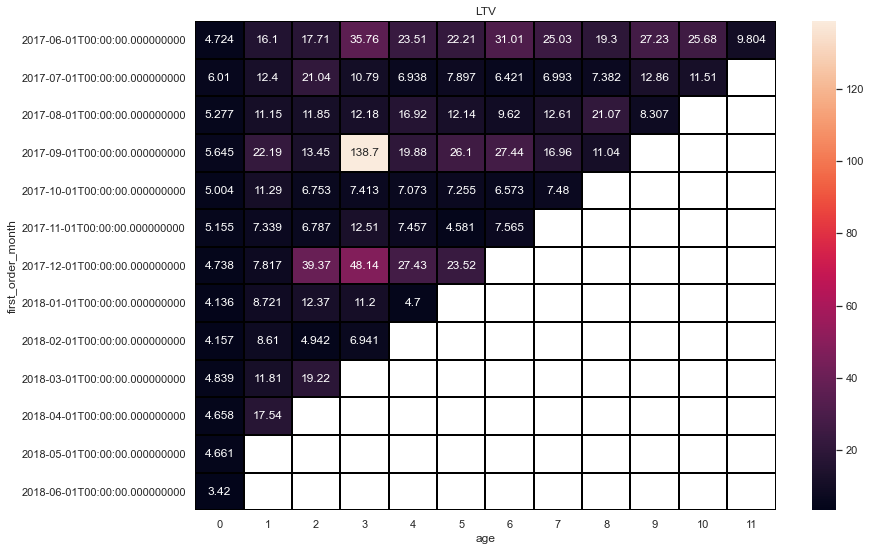

In [47]:
final_ltv = cohorts.pivot_table(
    index='first_order_month', 
    columns='age', 
    values='ltv', 
    aggfunc='mean')
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('LTV')
sns.heatmap(final_ltv, annot=True, fmt='.4', linewidths=1, linecolor='black');

In [48]:
m12_cum_ltv = final_ltv.mean(axis=0).cumsum()[11]
print("Средний LTV за 12 месяцев после первой покупки:", m12_cum_ltv)

Средний LTV за 12 месяцев после первой покупки: 180.80169252385213


**Вывод**: чтобы вложения в маркетинг окупались, маркетинговые расходы на одного пользователя не должны быть больше 180.8 у.е. за 12 месяцев.
А еще есть ярко выраженная сезонность: пользователи многих когорт активны в сентябре и декабре. Равно как те, кто начинают покупать в этих месяцах, приносят больше денег.

#### Посчитать ежемесячные траты - в целом и по источникам <a id='s2_t8'></a>

- Помесячные траты в целом

В среднем тратим в месяц: 27427.634999999995


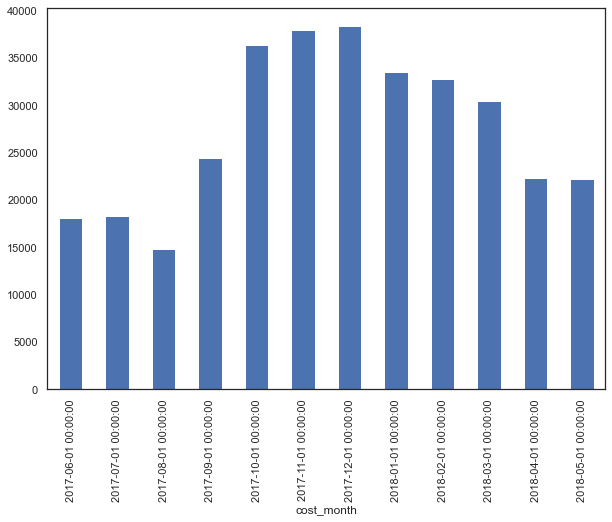

In [49]:
#сгруппируем по месяцам
costs['cost_month'] = costs['dt'].astype('datetime64[M]')

monthly_costs = costs.groupby('cost_month').agg({'costs': 'sum'})
monthly_costs['costs'].plot.bar(x = 'cost_month', figsize=(10,7));
print('В среднем тратим в месяц:', monthly_costs['costs'].mean()) 

- Траты по источникам

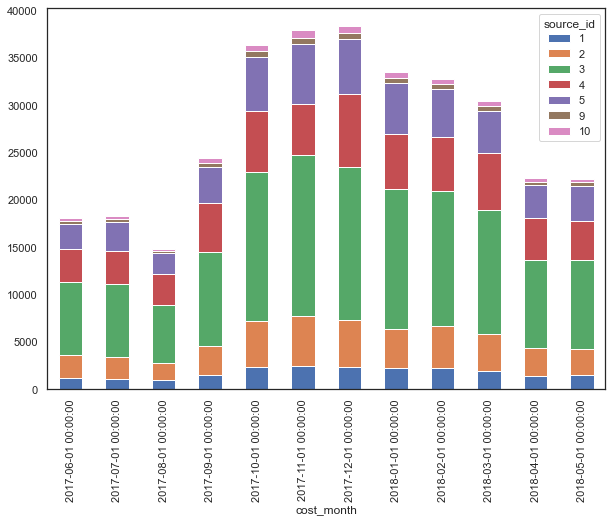

In [50]:
costs_by_month_source = costs.groupby(['cost_month', 'source_id']).agg({'costs': 'sum'}).reset_index()
costs_by_month_source.columns = ['cost_month', 'source_id', 'costs_sum']

costs_by_month_source_pivot = costs_by_month_source.pivot(index='cost_month', columns='source_id', values='costs_sum')
costs_by_month_source_pivot.plot.bar(stacked=True, figsize=(10,7));

- Тепловая карта трат по источникам

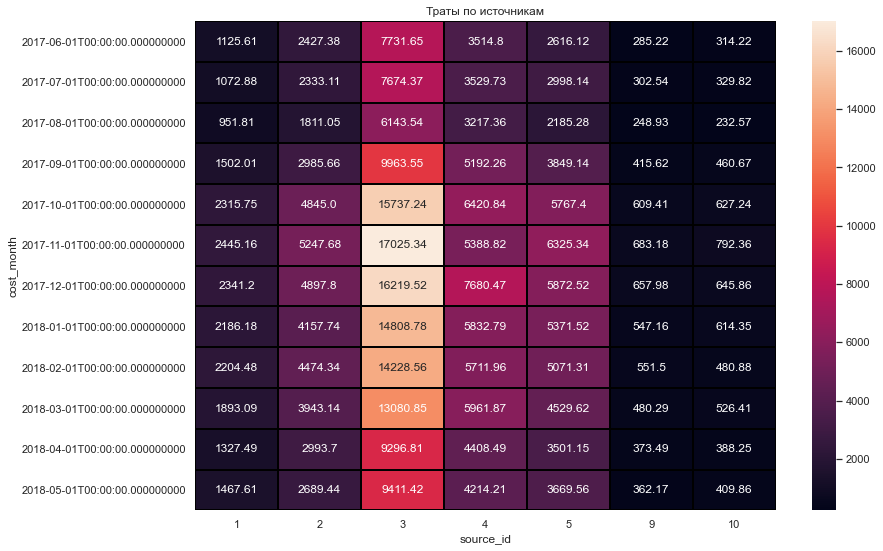

In [51]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Траты по источникам')
sns.heatmap(costs_by_month_source_pivot, annot=True, fmt='.7', linewidths=1, linecolor='black');

In [52]:
# сколько всего потратили на каждый источник
costs_by_source = costs.groupby('source_id').agg({'costs': 'sum'}).reset_index()
costs_by_source.columns = ['source_id', 'costs_sum']
print(costs_by_source)

   source_id  costs_sum
0          1   20833.27
1          2   42806.04
2          3  141321.63
3          4   61073.60
4          5   51757.10
5          9    5517.49
6         10    5822.49


**Вывод**: на самый дорогой 3. Плюс есть другие дорогие источники. Теперь надо убедиться, что именно эти источники приносят нам больше всего покупок

#### Посчитать CAC <a id='s2_t9'></a> 

In [53]:
#оценим стоимость привлечения по источникам в целом
orderers_by_source = agg_table.groupby('source_id').agg({'uid':'nunique'}).reset_index()
orderers_by_source.columns = ['source_id', 'unique_uid_count']
buyer_attraction_table = orderers_by_source.merge(costs_by_source, on = 'source_id')
buyer_attraction_table['cac'] = buyer_attraction_table['costs_sum'] / buyer_attraction_table['unique_uid_count'] 
print("Стоимость привлечения одного покупателя из каждого источника:")
print(buyer_attraction_table.loc[:, ['source_id', 'cac']])

Стоимость привлечения одного покупателя из каждого источника:
   source_id        cac
0          1   3.991813
1          2   9.323903
2          3  15.711132
3          4   6.294949
4          5   7.002720
5          9   5.820137
6         10   4.606400


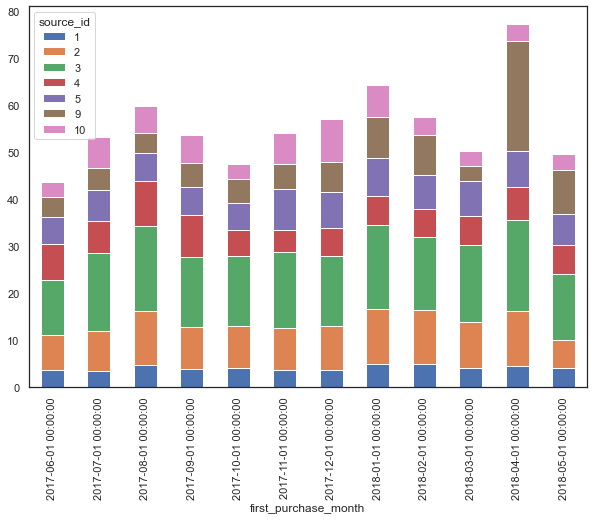

In [54]:
#Если по источникам и месяцам:
agg_table['first_purchase_month'] = agg_table['first_purchase'].astype('datetime64[M]')
buyers_by_month = agg_table.groupby(['source_id', 'first_purchase_month']).agg({'uid':'nunique'}).reset_index()
buyers_by_month.columns = ['source_id', 'first_purchase_month', 'unique_uid_count']
buyer_attraction_table_monthly = costs_by_month_source.merge(buyers_by_month, left_on = ['cost_month', 'source_id'], right_on = ['first_purchase_month', 'source_id'])
buyer_attraction_table_monthly['monthly_cac'] = buyer_attraction_table_monthly['costs_sum'] / buyer_attraction_table_monthly['unique_uid_count']
buyer_attraction_table_monthly_pivot = buyer_attraction_table_monthly.pivot_table(index = 'first_purchase_month', columns = 'source_id', values = 'monthly_cac')
buyer_attraction_table_monthly_pivot.plot.bar(stacked=True, figsize=(10,7));

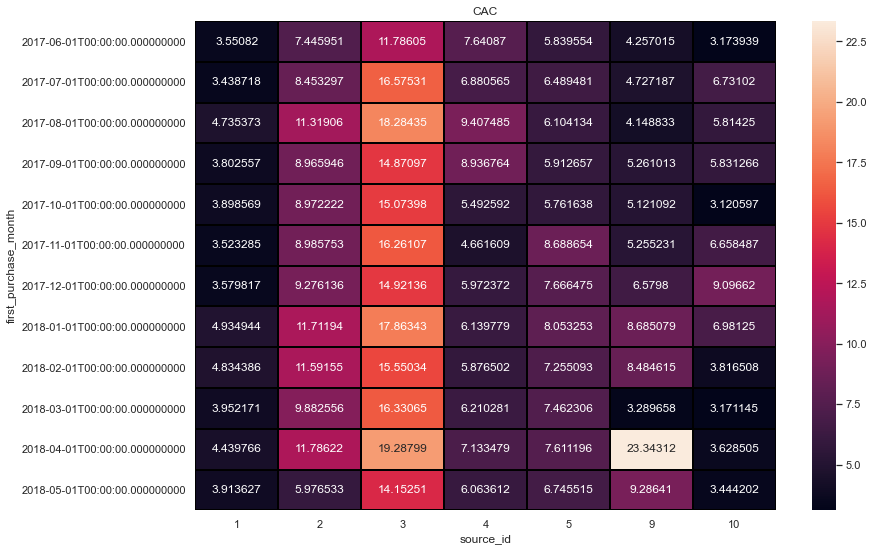

In [55]:
#тепловая карта
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('CAC')
sns.heatmap(buyer_attraction_table_monthly_pivot, annot=True, fmt='.7', linewidths=1, linecolor='black');

**Вывод**: по-прежнему самые дорогие пользователи в 3 источнике. Надо посчитать ROMI - понять, стоит ли сливать бюджет на эти источники

#### Посчитать ROMI <a id='s2_t10'></a> 

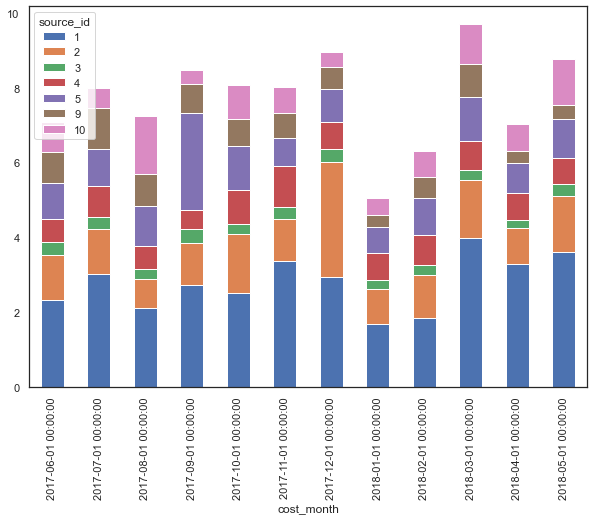

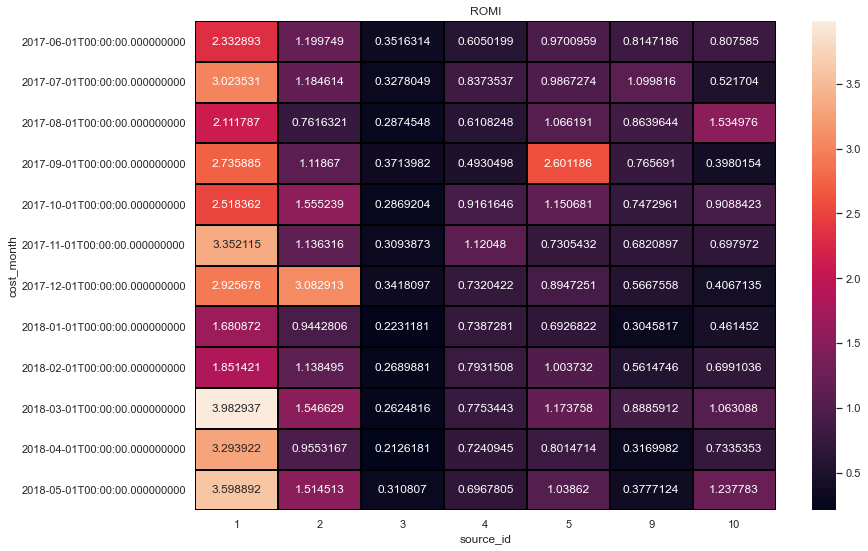

In [56]:
#чтобы посчитать romi пересчитаемм ltv не по месяцам, а по источникам:
ltv_by_source = agg_table.groupby(['order_month', 'source_id']).agg({'revenue':'sum', 'uid': 'nunique'}).reset_index()
ltv_by_source.columns = ['order_month', 'source_id', 'revenue_sum', 'uid_count']
ltv_by_source['ltv'] = ltv_by_source['revenue_sum']/ltv_by_source['uid_count']
romi_by_source = buyer_attraction_table_monthly.merge(ltv_by_source, left_on = ['cost_month','source_id'], right_on = ['order_month','source_id'])
romi_by_source['romi'] = romi_by_source['ltv']/romi_by_source['monthly_cac']
romi_by_source_pivot = romi_by_source.pivot_table(index = 'cost_month', columns = 'source_id', values = 'romi')
romi_by_source_pivot.plot.bar(stacked=True, figsize=(10,7));
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('ROMI')
sns.heatmap(romi_by_source_pivot, annot=True, fmt='.7', linewidths=1, linecolor='black');

**Вывод**: третий, самый дорогой источник не приносит денег - его нужно отключить или оптимизировать. Можно также рассмотреть отключение или оптимизацию 4 источника - он приносит мало. А вот на первый источник надо обратить внимание - даже с маленькими влоджениями он приводит много людей.

### Шаг 3. Напишите вывод: порекомендуйте маркетологам, куда и сколько им стоит вкладывать денег? <a id='s3'></a> 
- Какие источники/платформы вы бы порекомендовали? 
- Объясните свой выбор: на какие метрики вы ориентируетесь? Почему? 
- Какие выводы вы сделали, узнав значение метрик?

- Из источников рекомендую 1,2. Также рекомендую отключиить или пересмотреть расходы в источниках 3 и 4.  - это видно по метрике ROMI, которая показывает, соотношение доходов от когорты к расходам на нее, и ее нужно держать плюсовой. причем тенденция сохраняется помесячно, несмотря на то, что люди в разные месяцы тратят разные суммы денег.
- Из платформ рекомендую десктоп, тк там выше Retention Rate. Также рекомендую разобраться, что не так с тачами - то ли маркетологи не в те источники сливают деньги (и тачи оказываются неохвачены - этого не видно, тк бюджет не дифференцирован по платформам), то ли там в интерфейсе дело, и тогда продуктовому народу надо его улучшать для тачевого пользователя. А еще рекомендую дифференцировать расходы по платформам - так не надо будет гадать, все ли так с выбором источников на тачах. 
- Рекомендую стараться привлечь больше новых людей в сентябрьскую когорту - визитеров там средне, возвращаются они примерно как все (см. retention rate для визитов помесячно), а вот покупатели из них получаются очень хорошие: и средний чек, и ltv у них выше других. Это кажется возможным, тк маркетинговые расходы в сентябре не слишком высокие - сейчас они повышаются в октябре, а надо уже в сентябре, возможно, перекинуть бюджет с месяцев, где покупают все равно плохо. 
